In [4]:
import cv2
import mediapipe as mp
import numpy as np
import pickle
import imageio

import matplotlib.pyplot as plt

In [11]:
# Initialize MediaPipe Hand Landmarker.
mp_hands = mp.solutions.hands
hands = mp_hands.Hands(
    static_image_mode=False,  # For video processing this has to be set to False
    max_num_hands=1,
    min_detection_confidence=0.5
)

def get_normalized_landmarks(image, results):
    height, width, _ = image.shape
    all_hand_features = []
    if results.multi_hand_landmarks:
        for hand_landmarks in results.multi_hand_landmarks:
            x_center = np.mean([lm.x * width for lm in hand_landmarks.landmark])
            y_center = np.mean([lm.y * height for lm in hand_landmarks.landmark])
            center = np.array([x_center, y_center])
            max_dist = max(np.linalg.norm(np.array([lm.x * width, lm.y * height]) - center) for lm in hand_landmarks.landmark)
            hand_features = []
            for idx, lm in enumerate(hand_landmarks.landmark):
                x, y = int(lm.x * width), int(lm.y * height)
                norm_x = (x - x_center) / max_dist
                norm_y = (y - y_center) / max_dist
                norm_z = lm.z
                hand_features.extend([norm_x, norm_y, norm_z])
            all_hand_features.append(hand_features)
    return all_hand_features

def predict_video(file_path, model_path, frame_skip=1):
    # Load the pre-trained classifier
    with open(model_path, 'rb') as file:
        classifier = pickle.load(file)

    # Open video file
    cap = cv2.VideoCapture(file_path)
    predictions = []
    annotated_frames = []

    frame_count = 0
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break
        
        # Process only every frame_skip frames
        if frame_count % frame_skip == 0:
            input_image = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            results = hands.process(input_image)
            features = get_normalized_landmarks(input_image, results)
            if features:
                for feature in features:
                    prediction = classifier.predict([feature])[0]  # Assuming classifier returns numpy array
                    predictions.append(prediction)
                    # Annotate frame
                    annotated_frame = frame.copy()
                    cv2.putText(annotated_frame, str(prediction), (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 2, (255, 255, 255), 2, cv2.LINE_AA)
                    annotated_frames.append(annotated_frame)
        
        frame_count += 1

    cap.release()
    return predictions, annotated_frames

In [21]:
# Example usage
video_file = 'first test video.mp4'
model_file = 'classifier.pkl'
frame_skip = 1
predictions, frames_with_predictions = predict_video(video_file, model_file, frame_skip)


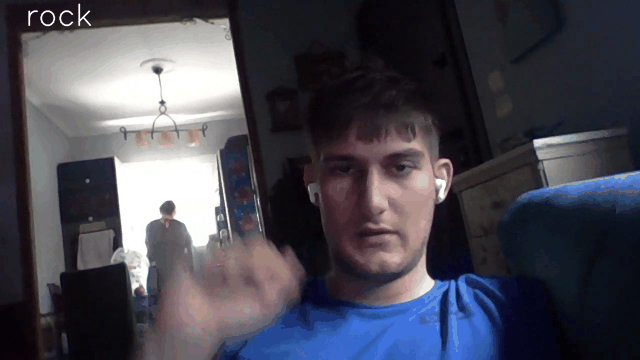

In [22]:
scale_percent = 50  # percentage of original size

# Resize the frames
small_frames = [cv2.resize(frame, (int(frame.shape[1] * scale_percent / 100), int(frame.shape[0] * scale_percent / 100))) for frame in frames_with_predictions]

# Convert frames to RGB for imageio compatibility and create the GIF
frames_for_gif = [cv2.cvtColor(frame, cv2.COLOR_BGR2RGB) for frame in small_frames]
imageio.mimsave('test.gif', frames_for_gif, fps=5)

# Display the GIF in the notebook
from IPython.display import Image, display
display(Image(filename='test.gif'))

